In [3]:
#import
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE

In [4]:
#read data
df=pd.read_excel(r"C:\Users\Hxtreme\Jupyter_Notebook_Learning\Project3_V1\Dataset\parkinsons_data.xlsx")
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [6]:
df.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [7]:
df.isnull().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

In [8]:
#duplicates
duplicates=df[df.duplicated()]
duplicates

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE


In [9]:
df.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

In [10]:
#target - Status
df['status'].value_counts()

status
1    147
0     48
Name: count, dtype: int64

In [11]:
df.groupby('status').mean(numeric_only=True)

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
status,,,,,,,,,,,,,,,,,,,,,
0,181.937771,223.636750,145.207292,0.003866,0.000023,0.001925,0.002056,0.005776,0.017615,0.162958,...,0.013305,0.028511,0.011483,24.678750,0.442552,0.695716,-6.759264,0.160292,2.154491,0.123017
1,145.180762,188.441463,106.893558,0.006989,0.000051,0.003757,0.003900,0.011273,0.033658,0.321204,...,0.027600,0.053027,0.029211,20.974048,0.516816,0.725408,-5.333420,0.248133,2.456058,0.233828


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


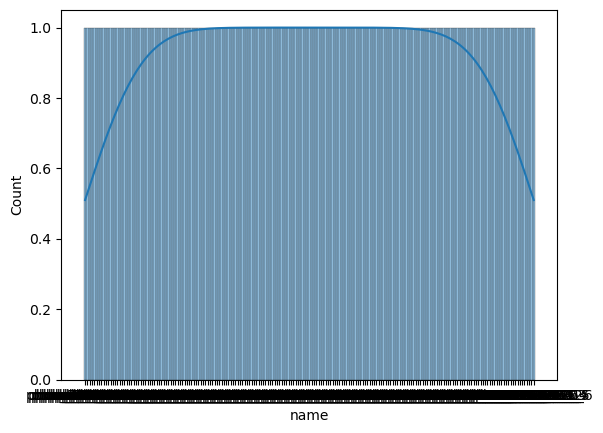

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


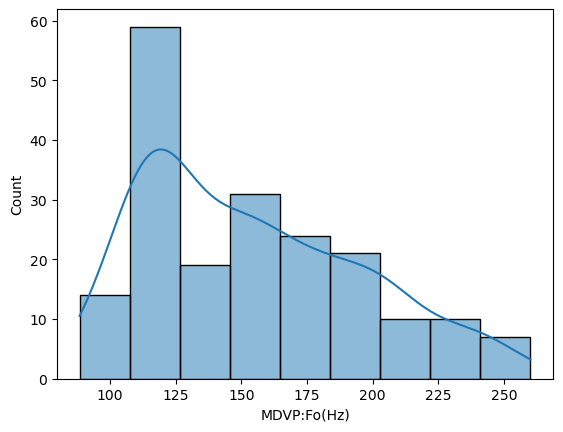

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


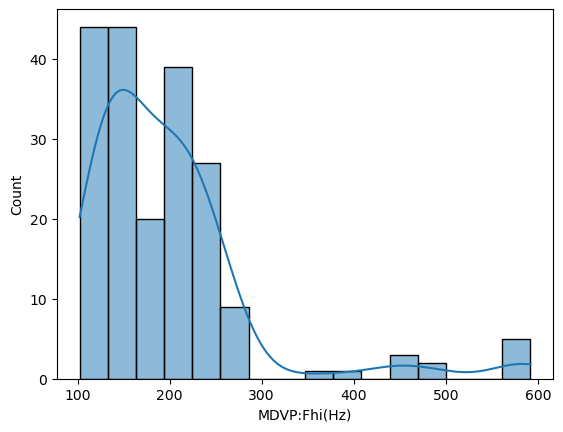

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


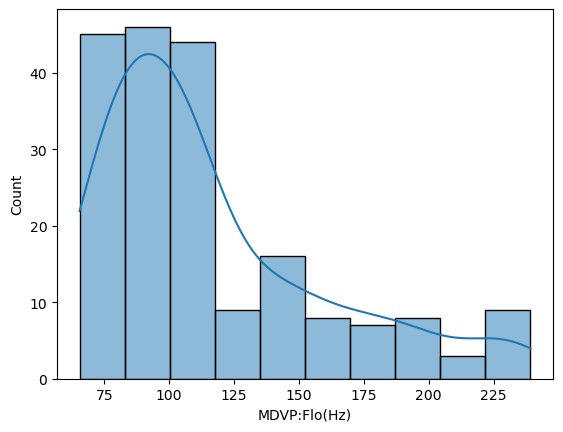

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


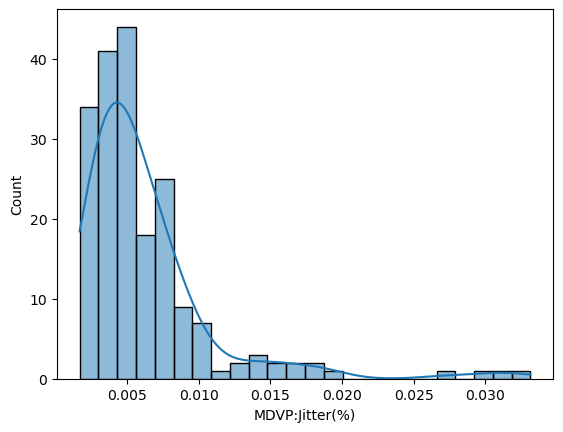

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


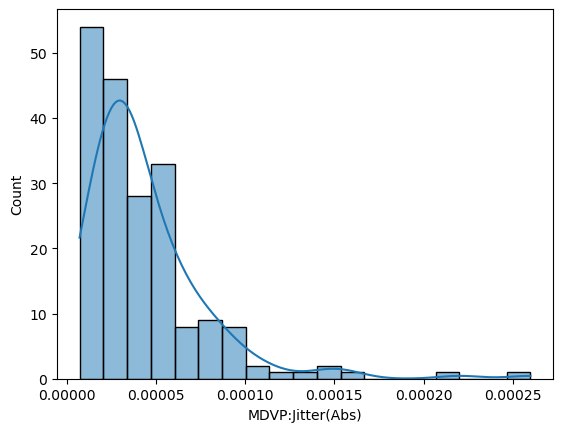

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


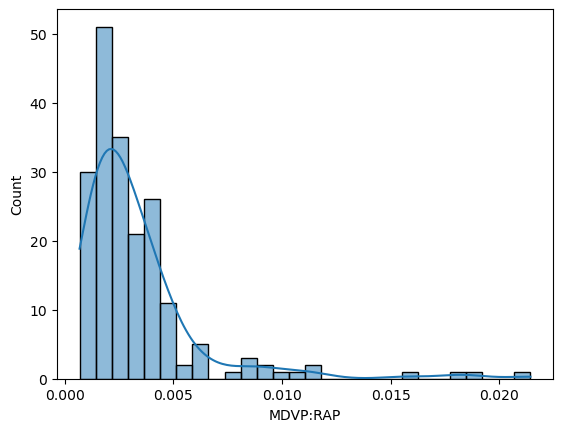

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


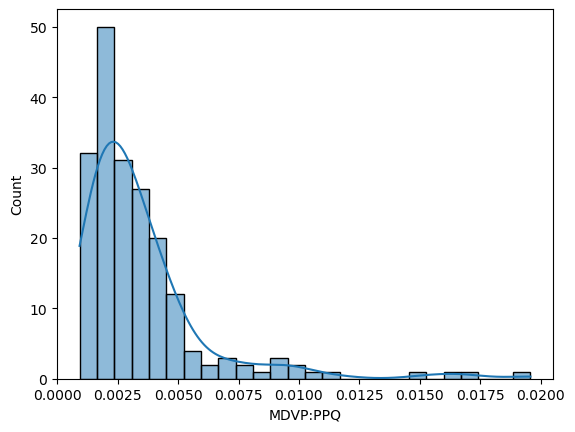

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


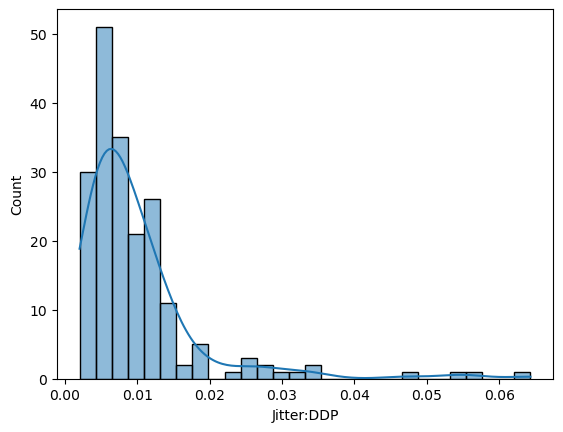

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


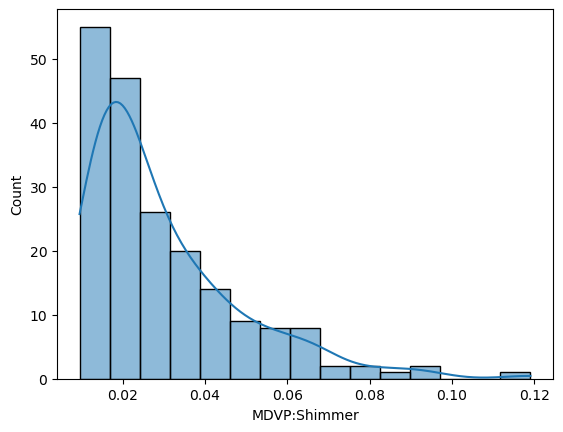

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


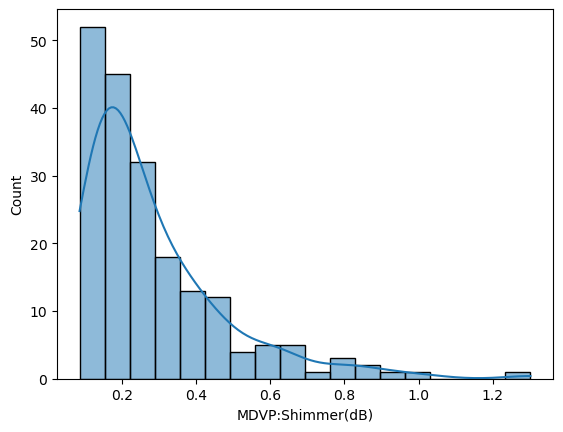

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


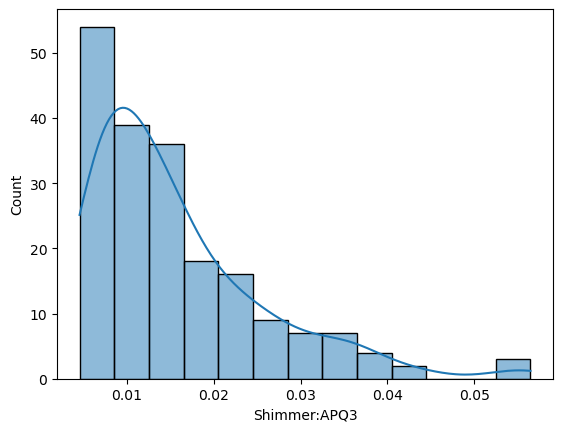

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


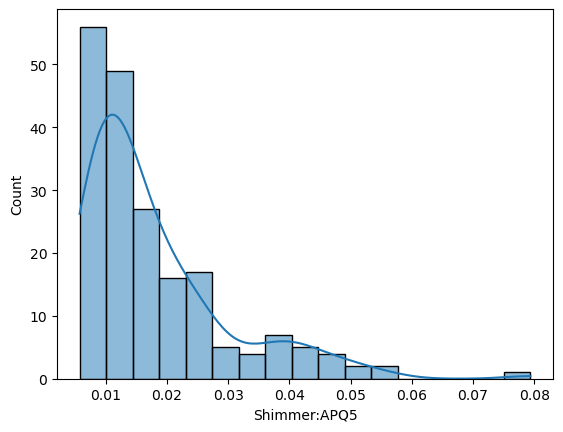

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


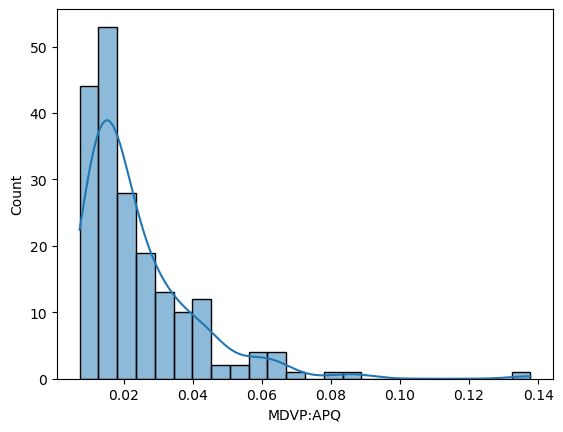

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


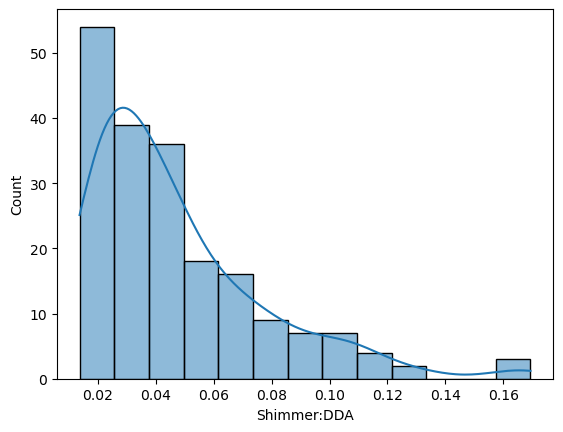

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


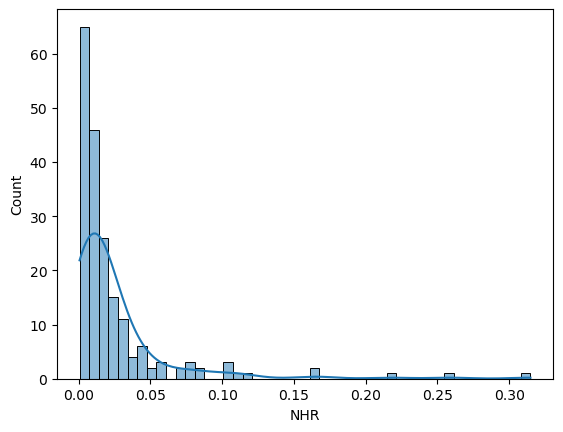

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


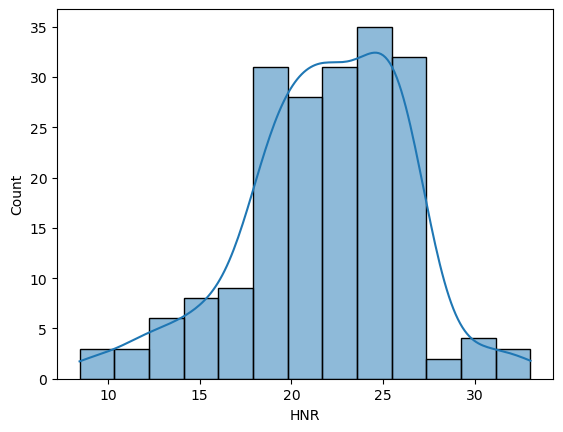

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


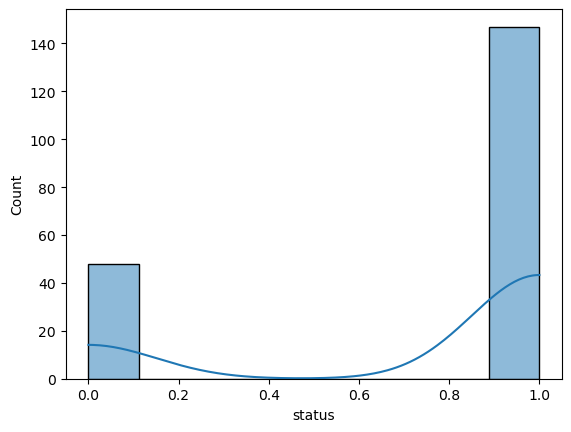

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


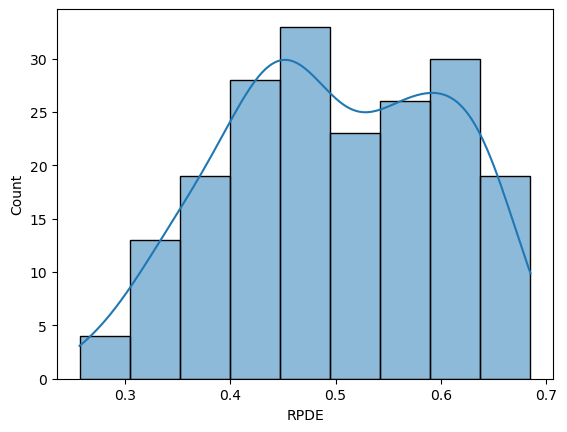

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


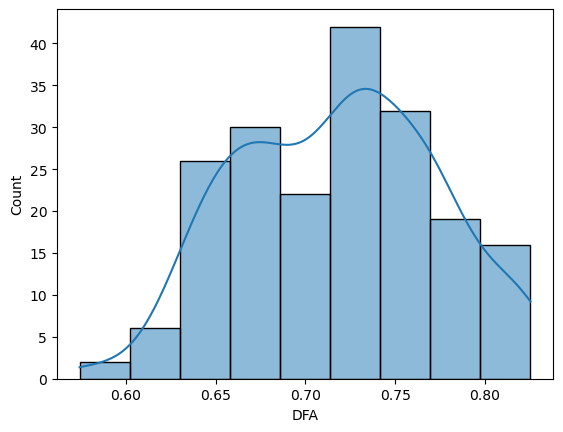

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


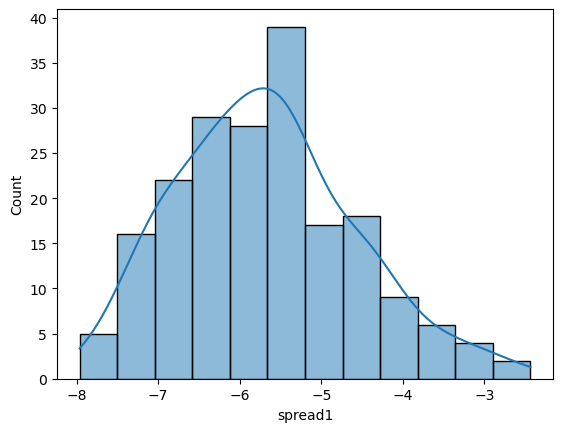

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


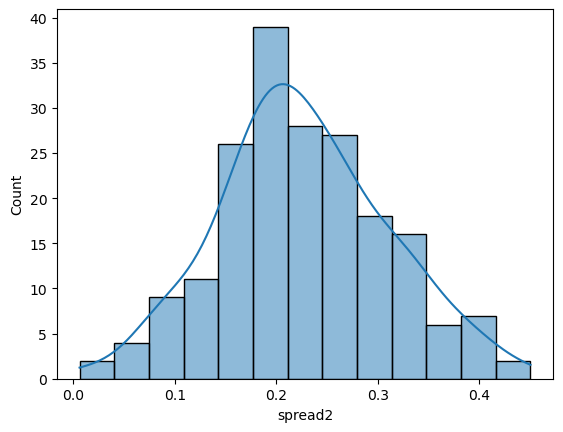

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


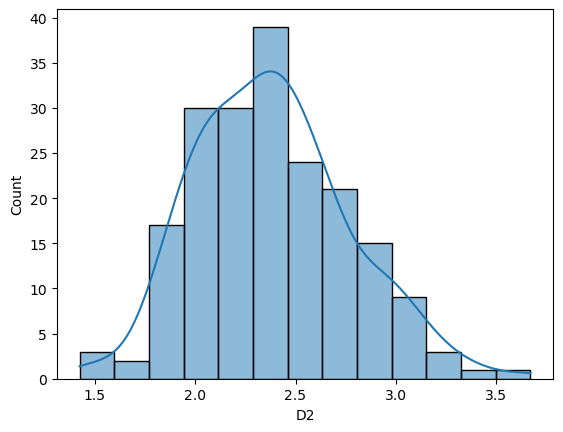

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


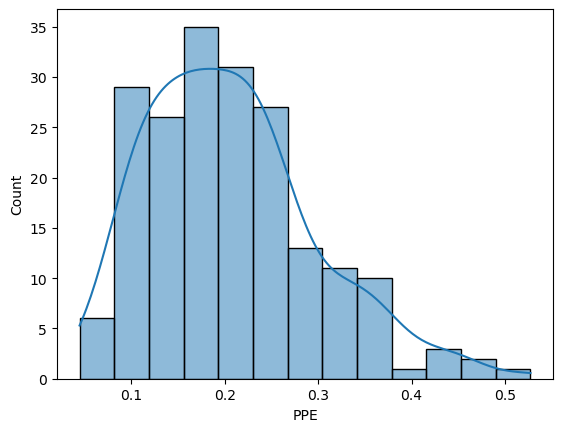

In [12]:
#EDA
#univariate_numeric
for col in df:
    sb.histplot(data=df,x=col,kde=True)
    plt.show()

In [13]:
#bivariate
sb.pairplot(df, hue="status",height=3, aspect=1.2) 
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

In [14]:
df_corr=df.drop(columns=['name'],axis=1)

In [15]:
#multivariate
df_corr.corr()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
MDVP:Fo(Hz),1.000000,0.400985,0.596546,-0.118003,-0.382027,-0.076194,-0.112165,-0.076213,-0.098374,-0.073742,...,-0.094732,-0.021981,0.059144,-0.383535,-0.383894,-0.446013,-0.413738,-0.249450,0.177980,-0.372356
MDVP:Fhi(Hz),0.400985,1.000000,0.084951,0.102086,-0.029198,0.097177,0.091126,0.097150,0.002281,0.043465,...,-0.003733,0.163766,-0.024893,-0.166136,-0.112404,-0.343097,-0.076658,-0.002954,0.176323,-0.069543
MDVP:Flo(Hz),0.596546,0.084951,1.000000,-0.139919,-0.277815,-0.100519,-0.095828,-0.100488,-0.144543,-0.119089,...,-0.150737,-0.108670,0.210851,-0.380200,-0.400143,-0.050406,-0.394857,-0.243829,-0.100629,-0.340071
MDVP:Jitter(%),-0.118003,0.102086,-0.139919,1.000000,0.935714,0.990276,0.974256,0.990276,0.769063,0.804289,...,0.746635,0.906959,-0.728165,0.278220,0.360673,0.098572,0.693577,0.385123,0.433434,0.721543
MDVP:Jitter(Abs),-0.382027,-0.029198,-0.277815,0.935714,1.000000,0.922911,0.897778,0.922913,0.703322,0.716601,...,0.697170,0.834972,-0.656810,0.338653,0.441839,0.175036,0.735779,0.388543,0.310694,0.748162
MDVP:RAP,-0.076194,0.097177,-0.100519,0.990276,0.922911,1.000000,0.957317,1.000000,0.759581,0.790652,...,0.744919,0.919521,-0.721543,0.266668,0.342140,0.064083,0.648328,0.324407,0.426605,0.670999
MDVP:PPQ,-0.112165,0.091126,-0.095828,0.974256,0.897778,0.957317,1.000000,0.957319,0.797826,0.839239,...,0.763592,0.844604,-0.731510,0.288698,0.333274,0.196301,0.716489,0.407605,0.412524,0.769647
Jitter:DDP,-0.076213,0.097150,-0.100488,0.990276,0.922913,1.000000,0.957319,1.000000,0.759555,0.790621,...,0.744901,0.919548,-0.721494,0.266646,0.342079,0.064026,0.648328,0.324377,0.426556,0.671005
MDVP:Shimmer,-0.098374,0.002281,-0.144543,0.769063,0.703322,0.759581,0.797826,0.759555,1.000000,0.987258,...,0.987626,0.722194,-0.835271,0.367430,0.447424,0.159954,0.654734,0.452025,0.507088,0.693771
MDVP:Shimmer(dB),-0.073742,0.043465,-0.119089,0.804289,0.716601,0.790652,0.839239,0.790621,0.987258,1.000000,...,0.963202,0.744477,-0.827805,0.350697,0.410684,0.165157,0.652547,0.454314,0.512233,0.695058


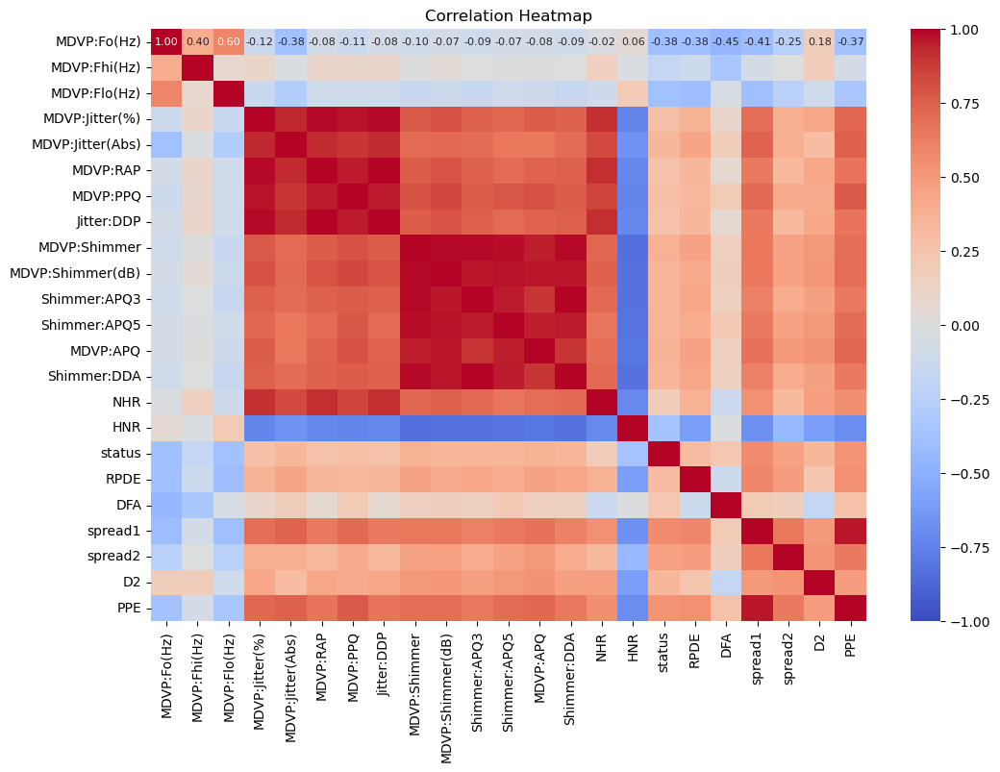

In [16]:
plt.figure(figsize=(12,8)) 
sb.heatmap(df.corr(numeric_only=True), cmap="coolwarm", annot=True, fmt=".2f", annot_kws={"size": 8}, vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

In [12]:
#separate data and target
x=df.drop(columns=['name','status'],axis=1)
y=df['status']

In [13]:
#split train/test data
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=2)

In [14]:
#RFC
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)

RandomForestClassifier()

In [15]:
# Get feature importance
rf_importances = rfc.feature_importances_

In [16]:
# Convert to DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': rf_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

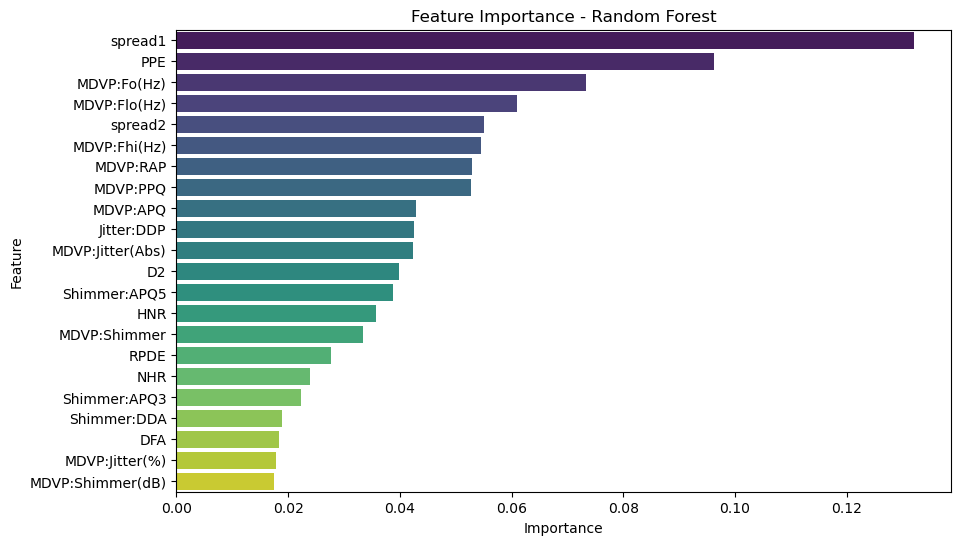

In [17]:
# Plot feature importance
plt.figure(figsize=(10, 6))
sb.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance - Random Forest')
plt.show()

In [18]:
df['status'].value_counts()

status
1    147
0     48
Name: count, dtype: int64

In [19]:
sx_ = df.drop(columns=['name','status'],axis=1)
sy_ = df['status']

In [20]:
#SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_osampled, y_osampled = smote.fit_resample(sx_, sy_)

In [21]:
df_smote = pd.DataFrame(x_osampled, columns=sx_.columns)
df_smote['status'] = y_osampled

In [22]:
print(df_smote['status'].value_counts())

status
1    147
0    147
Name: count, dtype: int64


In [69]:
X1 = df_smote[['spread1','PPE','MDVP:Fo(Hz)','MDVP:PPQ','MDVP:Jitter(Abs)','Jitter:DDP',
                'MDVP:RAP','spread2','D2','HNR']]
y1 = df_smote['status']

In [71]:
#split data to train and test
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X1, y1, test_size = 0.30, random_state = 5)

In [72]:
#data standardization
scaler=StandardScaler()

In [73]:
scaler.fit(x_train)

StandardScaler()

In [74]:
std_x_train=scaler.transform(x_train)
std_x_test=scaler.transform(x_test)

In [28]:
#Model

In [75]:
#DTC
dtc = DecisionTreeClassifier()
dtc.fit(std_x_train, y_train)

DecisionTreeClassifier()

In [76]:
dtc_acc = accuracy_score(y_test, dtc.predict(std_x_test))
print(dtc_acc)
print(accuracy_score(y_train, dtc.predict(std_x_train)))
print(confusion_matrix(y_test, dtc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, dtc.predict(std_x_test))}")

0.9101123595505618
1.0
[[45  6]
 [ 2 36]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.88      0.92        51
           1       0.86      0.95      0.90        38

    accuracy                           0.91        89
   macro avg       0.91      0.91      0.91        89
weighted avg       0.91      0.91      0.91        89



In [77]:
#RFC
rfc = RandomForestClassifier()
rfc.fit(std_x_train, y_train)

RandomForestClassifier()

In [78]:
rfc_acc = accuracy_score(y_test, rfc.predict(std_x_test))
print(rfc_acc)
print(accuracy_score(y_train, rfc.predict(std_x_train)))
print(confusion_matrix(y_test, rfc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, rfc.predict(std_x_test))}")

0.9550561797752809
1.0
[[47  4]
 [ 0 38]]
Classification Report :- 
               precision    recall  f1-score   support

           0       1.00      0.92      0.96        51
           1       0.90      1.00      0.95        38

    accuracy                           0.96        89
   macro avg       0.95      0.96      0.95        89
weighted avg       0.96      0.96      0.96        89



In [79]:
#ADABC
abc = AdaBoostClassifier()
abc.fit(std_x_train, y_train)

AdaBoostClassifier()

In [80]:
abc_acc = accuracy_score(y_test, abc.predict(std_x_test))
print(abc_acc)
print(accuracy_score(y_train, abc.predict(std_x_train)))
print(confusion_matrix(y_test, abc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, abc.predict(std_x_test))}")

0.8876404494382022
0.9707317073170731
[[45  6]
 [ 4 34]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.92      0.88      0.90        51
           1       0.85      0.89      0.87        38

    accuracy                           0.89        89
   macro avg       0.88      0.89      0.89        89
weighted avg       0.89      0.89      0.89        89



In [83]:
#GBC
gbc = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, max_depth=5)
gbc.fit(std_x_train, y_train)

GradientBoostingClassifier(max_depth=5, n_estimators=200)

In [84]:
gbc_acc = accuracy_score(y_test, gbc.predict(std_x_test))
print(gbc_acc)
print(accuracy_score(y_train, gbc.predict(std_x_train)))
print(confusion_matrix(y_test, gbc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, gbc.predict(std_x_test))}")

0.9550561797752809
1.0
[[48  3]
 [ 1 37]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.98      0.94      0.96        51
           1       0.93      0.97      0.95        38

    accuracy                           0.96        89
   macro avg       0.95      0.96      0.95        89
weighted avg       0.96      0.96      0.96        89



In [85]:
#XGBC
xgbc = XGBClassifier()
xgbc.fit(std_x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [86]:
xgbc_acc = accuracy_score(y_test, xgbc.predict(std_x_test))
print(xgbc_acc)
print(accuracy_score(y_train, xgbc.predict(std_x_train)))
print(confusion_matrix(y_test, xgbc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, xgbc.predict(std_x_test))}")

0.9550561797752809
1.0
[[49  2]
 [ 2 36]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96        51
           1       0.95      0.95      0.95        38

    accuracy                           0.96        89
   macro avg       0.95      0.95      0.95        89
weighted avg       0.96      0.96      0.96        89



In [87]:
#LBGC
lgbc = LGBMClassifier()
lgbc.fit(std_x_train, y_train)

[LightGBM] [Info] Number of positive: 109, number of negative: 96
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 205, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.531707 -> initscore=0.127000
[LightGBM] [Info] Start training from score 0.127000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

LGBMClassifier()

In [88]:
lgbc_acc = accuracy_score(y_test, lgbc.predict(std_x_test))
print(lgbc_acc)
print(accuracy_score(y_train, lgbc.predict(std_x_train)))
print(confusion_matrix(y_test, lgbc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, lgbc.predict(std_x_test))}")

0.9550561797752809
1.0
[[49  2]
 [ 2 36]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96        51
           1       0.95      0.95      0.95        38

    accuracy                           0.96        89
   macro avg       0.95      0.95      0.95        89
weighted avg       0.96      0.96      0.96        89



C:\Users\Hxtreme\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\Hxtreme\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\Hxtreme\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\Hxtreme\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [89]:
#KNN
knnc = KNeighborsClassifier()
knnc.fit(std_x_train, y_train)

KNeighborsClassifier()

In [90]:
knnc_acc = accuracy_score(y_test, knnc.predict(std_x_test))
print(knnc_acc)
print(accuracy_score(y_train, knnc.predict(std_x_train)))
print(confusion_matrix(y_test, knnc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, knnc.predict(std_x_test))}")

0.9662921348314607
0.9365853658536586
[[51  0]
 [ 3 35]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        51
           1       1.00      0.92      0.96        38

    accuracy                           0.97        89
   macro avg       0.97      0.96      0.97        89
weighted avg       0.97      0.97      0.97        89



In [91]:
#NBC
nbc = GaussianNB()
nbc.fit(std_x_train, y_train)

GaussianNB()

In [92]:
nbc_acc = accuracy_score(y_test, nbc.predict(std_x_test))
print(nbc_acc)
print(accuracy_score(y_train, nbc.predict(std_x_train)))
print(confusion_matrix(y_test, nbc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, nbc.predict(std_x_test))}")

0.8089887640449438
0.8
[[45  6]
 [11 27]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.80      0.88      0.84        51
           1       0.82      0.71      0.76        38

    accuracy                           0.81        89
   macro avg       0.81      0.80      0.80        89
weighted avg       0.81      0.81      0.81        89



In [93]:
#SVC
svc = SVC()
svc.fit(std_x_train, y_train)

SVC()

In [94]:
svc_acc = accuracy_score(y_test, svc.predict(std_x_test))
print(svc_acc)
print(accuracy_score(y_train, svc.predict(std_x_train)))
print(confusion_matrix(y_test, svc.predict(std_x_test)))
print(f"Classification Report :- \n {classification_report(y_test, svc.predict(std_x_test))}")

0.9213483146067416
0.8926829268292683
[[47  4]
 [ 3 35]]
Classification Report :- 
               precision    recall  f1-score   support

           0       0.94      0.92      0.93        51
           1       0.90      0.92      0.91        38

    accuracy                           0.92        89
   macro avg       0.92      0.92      0.92        89
weighted avg       0.92      0.92      0.92        89



In [95]:
# Model Comparison

models = pd.DataFrame({
    'Model':['Decision Tree Classifier', 'Random Forest Classifier', 'Ada Boost Classifier', 'Gradient Boost Classifier',
             'XgBoost Classifier', 'Light GBoost Classifier','K-Nearest Neighbors Classifier','Neive Bayes Classifier','Support Vector Classifier'],
    'Score':[dtc_acc, rfc_acc, abc_acc, gbc_acc, xgbc_acc, lgbc_acc, knnc_acc, nbc_acc, svc_acc]
})

models.sort_values(by='Score', ascending = False)

,Model,Score
6,K-Nearest Neighbors Classifier,0.966292
1,Random Forest Classifier,0.955056
3,Gradient Boost Classifier,0.955056
4,XgBoost Classifier,0.955056
5,Light GBoost Classifier,0.955056
8,Support Vector Classifier,0.921348
0,Decision Tree Classifier,0.910112
2,Ada Boost Classifier,0.887640
7,Neive Bayes Classifier,0.808989


In [48]:
#Model Pickle

In [96]:
filename='parkinsons_model_v2.pkl'

In [97]:
import pickle
pickle.dump(rfc, open(filename,'wb'))

In [51]:
#import joblib

# Load the model using joblib
#parkinsons_model = joblib.load("parkinsons_model.pkl")


In [98]:
loaded_model=pickle.load(open('parkinsons_model_v2.pkl','rb'))

In [ ]:
for column in x.columns:
  print(column)

In [99]:
sample_negative = np.array([[ -7.3483,0.085569,197.076,0.00168,0.00001,0.00498,0.00166,0.177551,1.743867,26.775 ]])
#'spread1','PPE','MDVP:Fo(Hz)','MDVP:PPQ','MDVP:Jitter(Abs)','Jitter:DDP','MDVP:RAP','spread2','D2','HNR'

In [100]:
sample_positive = np.array([[-4.813031,0.284654,119.992,0.00554	,0.00007,0.01109,0.0037,0.266482,2.301442,21.033 ]])


In [101]:
# Predict
prediction = xgbc.predict(sample_negative)
print(f"Prediction: {prediction[0]}")

Prediction: 1


In [102]:
# Predict
prediction = xgbc.predict(sample_negative)
print(f"Prediction: {prediction[0]}")

Prediction: 1


In [106]:
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load the model
with open("parkinsons_model_v2.pkl", "rb") as file:
    parkinsons_model = pickle.load(file)

# Load scaler
scaler_path = "parkinsons_scaler.pkl"
try:
    with open(scaler_path, "rb") as file:
        scaler = pickle.load(file)
except FileNotFoundError:
    scaler = None

# Example input
raw_input = np.array([[ -7.3483,0.085569,197.076,0.00168,0.00001,0.00498,0.00166,0.177551,1.743867,26.775 ]])

# Apply Scaling if Required
if scaler:
    processed_input = scaler.transform(raw_input)
else:
    processed_input = raw_input

# Predict
proba = parkinsons_model.predict_proba(processed_input)
threshold = 0.6  # Adjust based on performance
prediction = 1 if proba[0][1] > threshold else 0

print(f"Prediction: {prediction[0]}")


TypeError: 'int' object is not subscriptable

In [105]:
proba = parkinsons_model.predict_proba(processed_input)
print(f"Probability of Positive: {proba[0][1]:.4f}")
print(f"Probability of Negative: {proba[0][0]:.4f}")


Probability of Positive: 0.5600
Probability of Negative: 0.4400


In [ ]:
#pip install scikit-learn==<correct_version>


In [ ]:
#import sklearn
#print(sklearn.__version__)  # Check your installed version


In [ ]:
#pip install scikit-learn==1.5.1